### Notebook for the integration and label transfer of lymphoid immune cells with `scANVI`

- **Developed by:** Carlos Talavera-López Ph.D
- **Würzburg Institute for Systems Immunology - Faculty of Medicine - Julius-Maximilian-Universität Würzburg**
- **Created on**: 240329
- **Last modified**: 240527

### Import required modules

In [1]:
import scvi
import torch
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import plotnine as p
from pywaffle import Waffle
import matplotlib.pyplot as plt
from scib_metrics.benchmark import Benchmarker

### Set up working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.7
scanpy      1.10.1
-----
PIL                 10.2.0
absl                NA
asttokens           NA
attr                23.2.0
chex                0.1.85
comm                0.2.1
contextlib2         NA
cycler              0.12.1
cython_runtime      NA
dateutil            2.8.2
debugpy             1.8.1
decorator           5.1.1
docrep              0.3.2
etils               1.7.0
executing           2.0.1
flax                0.8.1
fsspec              2024.2.0
h5py                3.10.0
igraph              0.11.4
importlib_resources NA
ipykernel           6.29.2
ipywidgets          8.1.2
jax                 0.4.19
jaxlib              0.4.19
jedi                0.19.1
joblib              1.3.2
kiwisolver          1.4.5
legacy_api_wrap     NA
lightning           2.1.4
lightning_utilities 0.10.1
llvmlite            0.42.0
matplotlib          3.8.3
mizani              0.11.0
ml_collections      NA
ml_dtypes           0.3.2
mpl_toolkits        NA
msgpack             1.

In [3]:
warnings.simplefilter(action = 'ignore')
scvi.settings.seed = 1712
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

Seed set to 1712


In [4]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 3,
)

### Read in pre-annotated dataset

In [5]:
DMD_lymphoid = sc.read_h5ad('../../../data/heart_mm_nuclei-23-0092_scANVI-Lymphoid_ctl240527.raw.h5ad')
DMD_lymphoid

AnnData object with n_obs × n_vars = 65544 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 'total_counts-DMD

In [6]:
DMD_lymphoid.obs['sample'].value_counts()

sample
A10_2               46783
B1_2                 9650
B2_2                 1917
A9_2                  684
Hashtag7-TotalA       595
Hashtag4-TotalA       593
Hashtag1-TotalA       549
Hashtag15-TotalA      502
Hashtag9-TotalA       486
Hashtag8-TotalA       418
Hashtag2-TotalA       413
Hashtag12-TotalA      412
Hashtag11-TotalA      409
Hashtag6-TotalA       379
A11_2                 350
Hashtag13-TotalA      324
A12_2                 316
Hashtag5-TotalA       227
Hashtag14-TotalA      204
Hashtag10-TotalA      187
Hashtag3-TotalA       146
Name: count, dtype: int64

In [7]:
DMD_lymphoid.obs['seed_labels'] = DMD_lymphoid.obs['cell_type'].copy()

In [8]:
DMD_lymphoid.obs['cell_type'].cat.categories

Index(['B_cells', 'B_mem', 'B_naive', 'CD4Tctl', 'CD4Th', 'CD4Tnaive',
       'CD8Tcm', 'CD8Tctl', 'CD8Tem', 'CD8Temra', 'CD8Tnaive', 'ILC', 'MAIT',
       'NK', 'NKT', 'Plasma_cells', 'T', 'Treg', 'gdT'],
      dtype='object')

In [9]:
DMD_lymphoid.obs['compartment'].cat.categories

Index(['DMD', 'MDX_POOL_NEW', 'MDX_MPC'], dtype='object')

### Split groups into reference and query

In [10]:
DMD_lymphoid.obs['genotype'].cat.categories

Index(['Mdx', 'MdxSCID', 'WT'], dtype='object')

In [11]:
reference = DMD_lymphoid[DMD_lymphoid.obs['genotype'].isin(['WT', 'MdxSCID'])]
reference

View of AnnData object with n_obs × n_vars = 62813 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 'total_co

In [12]:
query = DMD_lymphoid[~DMD_lymphoid.obs['genotype'].isin(['WT', 'MdxSCID'])]
query.obs['seed_labels'] = 'Unknown'
query

AnnData object with n_obs × n_vars = 2731 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 'total_counts-DMD_

In [13]:
adata = reference.concatenate(query, batch_key = 'batch', batch_categories = ['reference', 'query'], join = 'inner')
adata

AnnData object with n_obs × n_vars = 65544 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 'total_counts-DMD

In [14]:
adata.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata.obs.index])
adata.obs_names

Index(['AAACGCTGTTATAGAG-1_1-MDX_POOL_NEW',
       'AAAGAACTCCCGTGTT-1_1-MDX_POOL_NEW',
       'AACAAAGAGCGTTGTT-1_1-MDX_POOL_NEW',
       'AACAAAGTCAAGCCTA-1_1-MDX_POOL_NEW',
       'AACAAGAAGTTGAATG-1_1-MDX_POOL_NEW',
       'AACAAGATCGTTGTGA-1_1-MDX_POOL_NEW',
       'AACACACTCGGCTGAC-1_1-MDX_POOL_NEW',
       'AACAGGGGTAGACAAT-1_1-MDX_POOL_NEW',
       'AACCTGAAGGCGTCCT-1_1-MDX_POOL_NEW',
       'AACCTGATCTTAATCC-1_1-MDX_POOL_NEW',
       ...
       'TGTGGCGAGCTACAAA-1_2-MDX_MPC', 'TTAGTCTAGATGTTGA-1_2-MDX_MPC',
       'TTCCGGTGTCGTGCCA-1_2-MDX_MPC', 'TTCCGTGGTGCGGCTT-1_2-MDX_MPC',
       'TTCCTCTGTTAGTTCG-1_2-MDX_MPC', 'TTCTAACAGTCACACT-1_2-MDX_MPC',
       'TTGAGTGCACTCCGAG-1_2-MDX_MPC', 'TTGGGCGTCCCGTGAG-1_2-MDX_MPC',
       'TTTACTGAGATCACTC-1_2-MDX_MPC', 'TTTGGAGAGGATAATC-1_2-MDX_MPC'],
      dtype='object', length=65544)

- Clean merged object

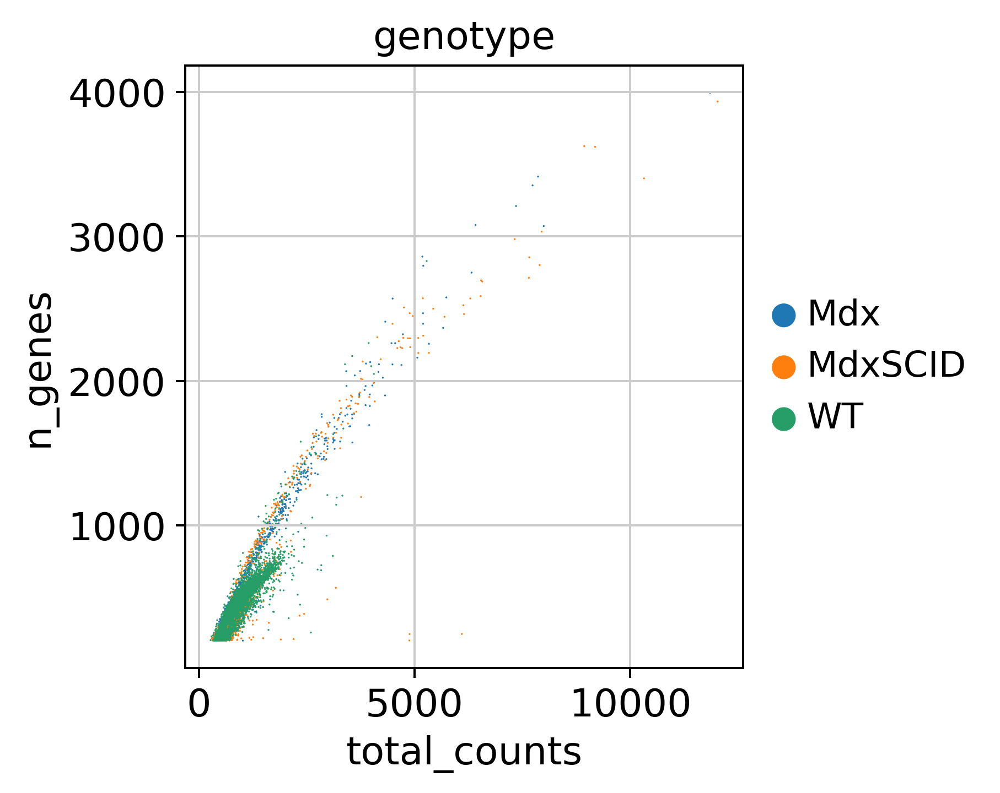

In [15]:
sc.pl.scatter(adata, x = 'total_counts', y = 'n_genes', color = "genotype", frameon = False)

In [16]:
adata.obs['genotype'].value_counts()

genotype
WT         49318
MdxSCID    13495
Mdx         2731
Name: count, dtype: int64

In [17]:
adata.obs['sample'].value_counts()

sample
A10_2               46783
B1_2                 9650
B2_2                 1917
A9_2                  684
Hashtag7-TotalA       595
Hashtag4-TotalA       593
Hashtag1-TotalA       549
Hashtag15-TotalA      502
Hashtag9-TotalA       486
Hashtag8-TotalA       418
Hashtag2-TotalA       413
Hashtag12-TotalA      412
Hashtag11-TotalA      409
Hashtag6-TotalA       379
A11_2                 350
Hashtag13-TotalA      324
A12_2                 316
Hashtag5-TotalA       227
Hashtag14-TotalA      204
Hashtag10-TotalA      187
Hashtag3-TotalA       146
Name: count, dtype: int64

In [18]:
adata.obs['seed_labels'].cat.categories

Index(['B_cells', 'B_mem', 'B_naive', 'CD4Tctl', 'CD4Th', 'CD4Tnaive',
       'CD8Tcm', 'CD8Tctl', 'CD8Tem', 'CD8Temra', 'CD8Tnaive', 'ILC', 'MAIT',
       'NK', 'NKT', 'Plasma_cells', 'T', 'Treg', 'Unknown', 'gdT'],
      dtype='object')

### Select HVGs

In [19]:
adata_raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 4000,
    layer = "counts",
    batch_key = "sample",
    subset = True,
    span = 1
)
adata

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 65544 × 4000
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 'total_counts-DMD_

### Transfer of annotation with scANVI

In [20]:
adata.obs['seed_labels'] = adata.obs['seed_labels'].fillna('Unknown')

In [21]:
scvi.model.SCVI.setup_anndata(adata,
                              batch_key = "sample", 
                            categorical_covariate_keys = ["donor", "cell_source"], 
                            labels_key = "seed_labels", 
                            layer = 'counts')

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [22]:
scvi_model = scvi.model.SCVI(adata, 
                             n_latent = 50, 
                             n_layers = 3, 
                             dispersion = 'gene-batch', 
                             gene_likelihood = 'nb')

In [23]:
scvi_model.train(20, 
                 check_val_every_n_epoch = 1, 
                 enable_progress_bar = True, 
                 accelerator = 'gpu',
                 devices = [0])

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 20/20: 100%|██████████| 20/20 [00:54<00:00,  2.54s/it, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.1e+3]  

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:54<00:00,  2.71s/it, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.1e+3]


In [24]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation(adata)

### Evaluate model performance using the [_Svensson_](https://www.nxn.se/valent/2023/8/10/training-scvi-posterior-predictive-distributions-over-epochs) method

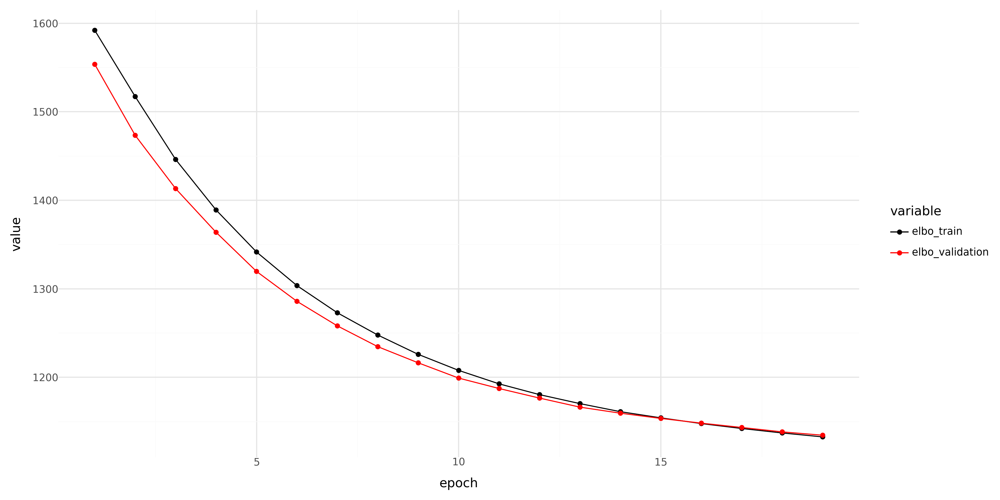

In [25]:
history_df = (
    scvi_model.history['elbo_train'].astype(float)
    .join(scvi_model.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

p_.save('fig1.png', dpi = 300)

print(p_)

### Label transfer with `scANVI` 

In [26]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [27]:
scanvi_model.train(15, 
                 check_val_every_n_epoch = 1, 
                 enable_progress_bar = True, 
                 accelerator = 'gpu',
                 devices = [0])

INFO     Training for 15 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 15/15: 100%|██████████| 15/15 [01:52<00:00,  6.35s/it, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.08e+3]

`Trainer.fit` stopped: `max_epochs=15` reached.


Epoch 15/15: 100%|██████████| 15/15 [01:52<00:00,  7.48s/it, v_num=1, train_loss_step=1.08e+3, train_loss_epoch=1.08e+3]


In [28]:
adata.obs["C_scANVI_S1"] = scanvi_model.predict(adata)

- Extract latent representation

In [29]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

### Explore model performance using the [_Svensson_](https://www.nxn.se/valent/2023/8/10/training-scvi-posterior-predictive-distributions-over-epochs) method

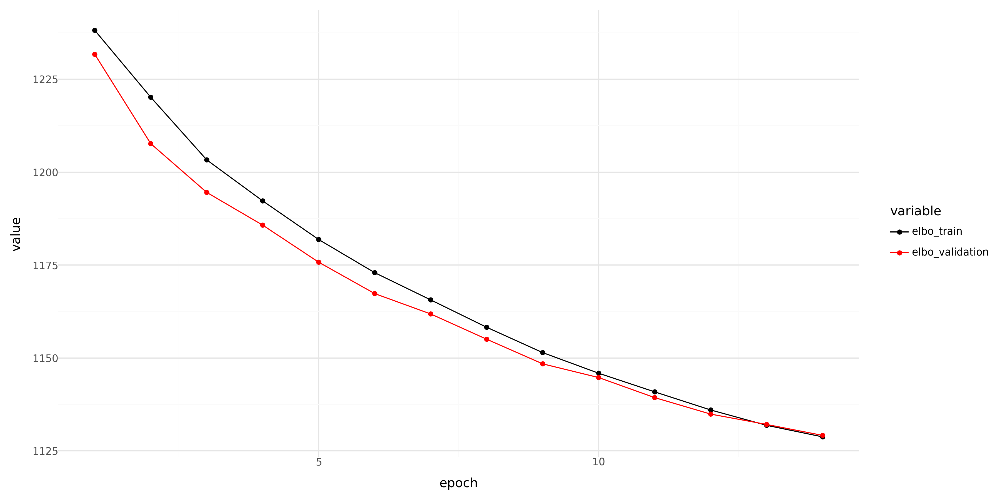

In [30]:
history_df = (
    scanvi_model.history['elbo_train'].astype(float)
    .join(scanvi_model.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

p_.save('fig1.png', dpi = 300)

print(p_)

### Visualise corrected dataset

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:32)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:45)


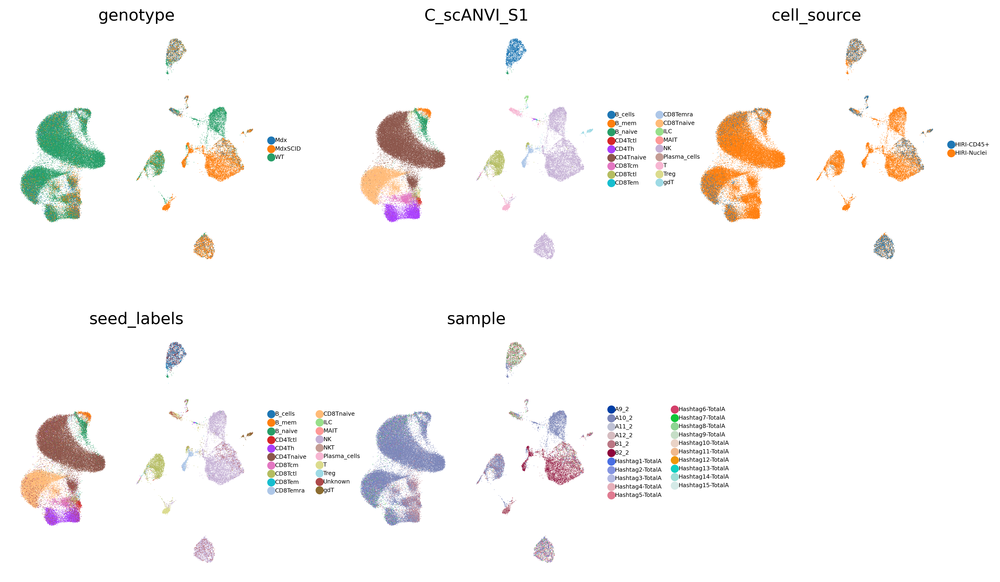

In [31]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 150, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.3, spread = 1, random_state = 1712)
sc.pl.umap(adata, frameon = False, color = ['genotype', 'C_scANVI_S1', 'cell_source', 'seed_labels', 'sample'], size = 0.8, legend_fontsize = 5, ncols = 3)

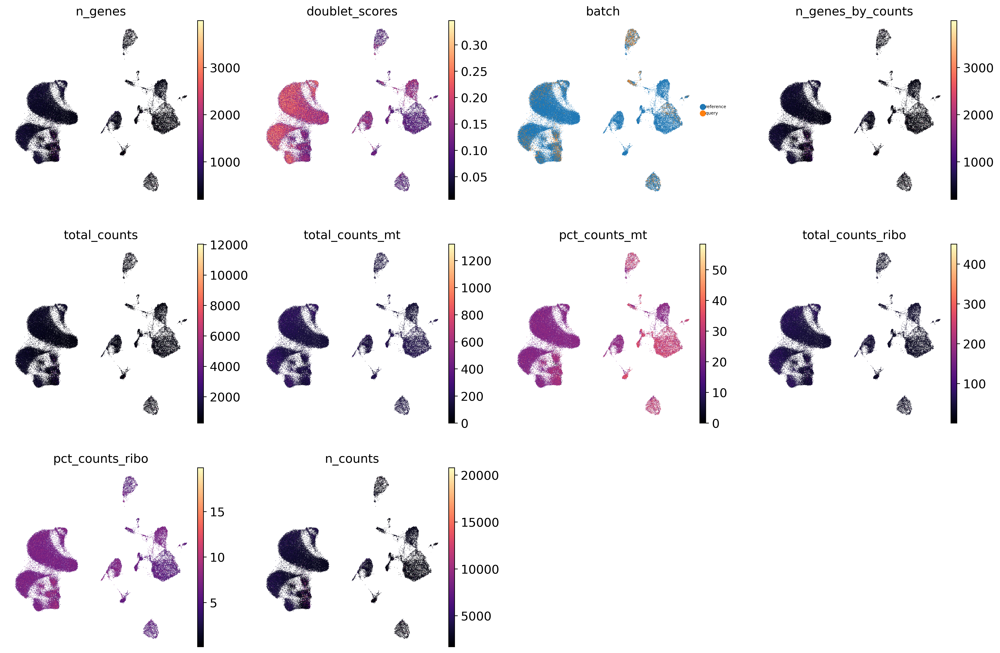

In [32]:
sc.pl.umap(adata, frameon = False, color = ['n_genes', 'doublet_scores', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_counts'], size = 1, legend_fontsize = 5, ncols = 4, cmap = 'magma')

### Modify object to plot canonical marker genes

In [33]:
adata_toplot = anndata.AnnData(X = np.sqrt(sc.pp.normalize_total(adata_raw, inplace = False)["X"]), var = adata_raw.var, obs = adata.obs, obsm = adata.obsm)
adata_toplot

normalizing counts per cell
    finished (0:00:00)


AnnData object with n_obs × n_vars = 65544 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'C_scANVI_S1'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 't

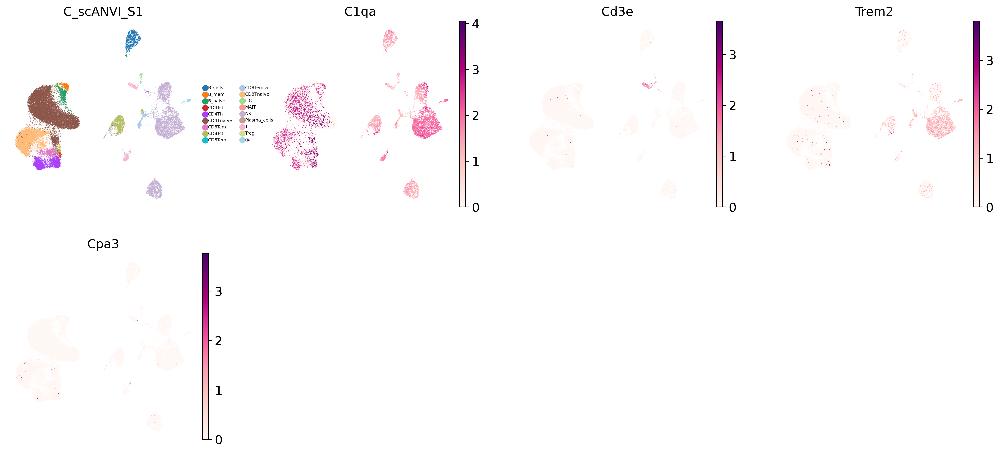

In [34]:
sc.pl.umap(adata_toplot, frameon = False, color = ['C_scANVI_S1', 'C1qa', 'Cd3e', 'Trem2', 'Cpa3'], size = 1, legend_fontsize = 5, ncols = 4, cmap = 'RdPu')

### Visualise proportions

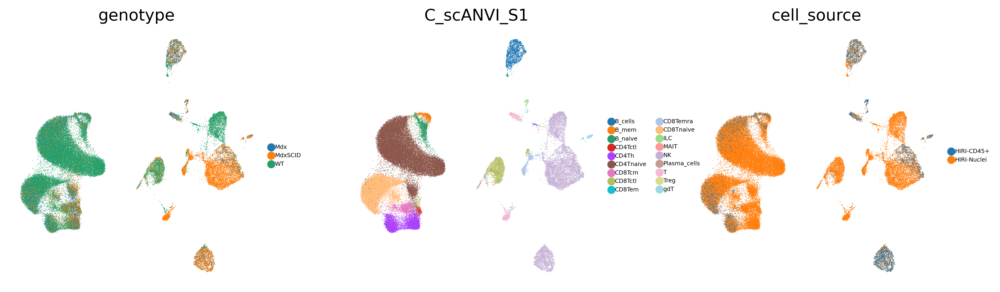

In [35]:
sc.pl.umap(adata, frameon = False, color = ['genotype', 'C_scANVI_S1', 'cell_source'], size = 1, legend_fontsize = 5, ncols = 4)

In [36]:
bauhaus_colors = ['#FF0000', '#FFFF00', '#000000', '#4D5D53', '#0000FF', '#808080']

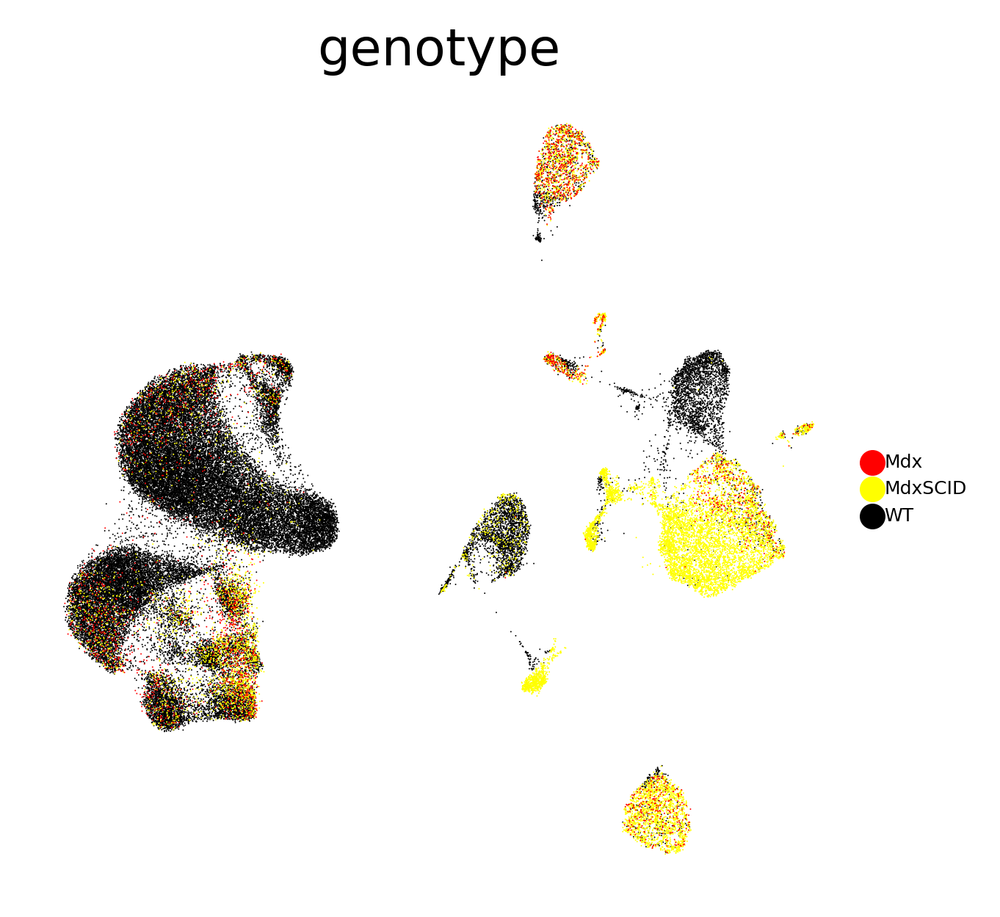

In [37]:
sc.pl.umap(adata, frameon = False, color = ['genotype'], size = 0.6, legend_fontsize = 5, ncols = 4, palette = bauhaus_colors)

In [38]:
df = adata_toplot.obs.groupby(['genotype', 'C_scANVI_S1']).size().reset_index(name = 'counts')

grouped = df.groupby('genotype')['counts'].apply(lambda x: x / x.sum() * 100)
grouped = grouped.reset_index()

df['proportions'] = grouped['counts']
df['waffle_counts'] = (df['proportions'] * 10).astype(int)

In [39]:
def generate_modified_bauhaus_palette(n_colors):
    # Define specific shades
    base_colors = [
        (1, 0, 0),      # Red
        (0.07, 0.04, 0.56),  # Ultramarine blue
        (0, 0.28, 0.67),  # Cobalt blue
        (1, 0.9, 0),  # Bauhaus yellow
        (0, 0, 0),  # Black
        (0.5, 0, 0.5),  # Purple
        (1, 0.55, 0),  # Orange
        (0.54, 0.17, 0.89),  # Violet
    ]

    # Create more distinct variations of each base color
    colors = []
    variation_steps = n_colors // len(base_colors) + 1
    for color in base_colors:
        for i in range(variation_steps):
            # Adjusting brightness and saturation
            variation = tuple(min(max(c * (0.8 + i * 0.1), 0), 1) for c in color)
            colors.append(variation)

    # Ensure we only use the number of colors needed
    unique_colors = []
    for color in colors:
        if color not in unique_colors:
            unique_colors.append(color)
        if len(unique_colors) == n_colors:
            break

    # Shuffle the unique colors
    np.random.shuffle(unique_colors)

    return unique_colors

# Generate the modified palette
bauhaus_palette = generate_modified_bauhaus_palette(18)

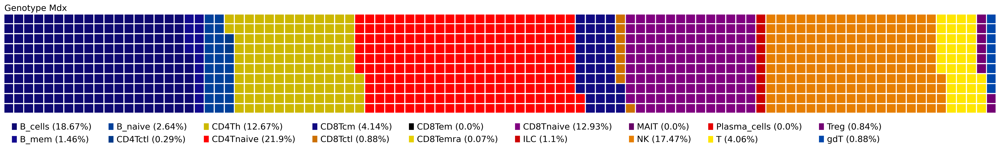

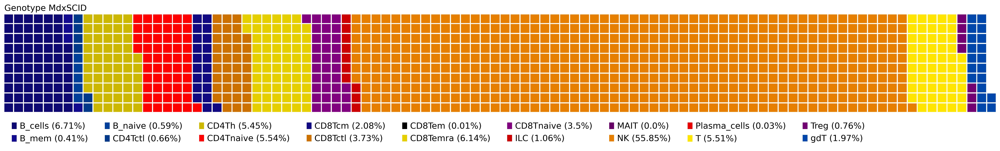

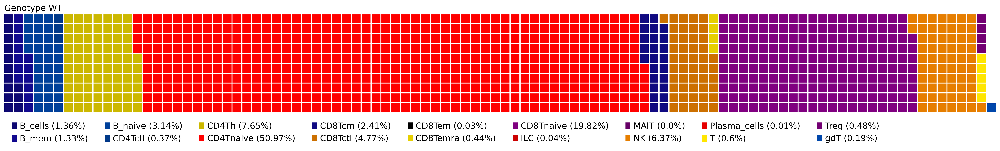

In [40]:
for group in df['genotype'].unique():
    temp_df = df[df['genotype'] == group]
    data = dict(zip(temp_df['C_scANVI_S1'], temp_df['waffle_counts']))

    # Ensure the color list matches the number of cell types
    colors = [bauhaus_palette[i % len(bauhaus_palette)] for i in range(len(temp_df['C_scANVI_S1']))]

    fig = plt.figure(
        FigureClass=Waffle, 
        rows=10, 
        values=data, 
        title={'label': f'Genotype {group}', 'loc': 'left', 'fontsize': 14},
        labels=[f"{k} ({v}%)" for k, v in zip(temp_df['C_scANVI_S1'], temp_df['proportions'].round(2))],
        legend={'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': 9, 'framealpha': 0, 'fontsize': 14},
        figsize=(40, 4),
        colors=colors
    )
    plt.show()

### Prepare object for export

- Fix label for cell annotation

In [41]:
adata.obs['cell_type'] = adata.obs['C_scANVI_S1'].copy()
adata.obs['cell_type'] = adata.obs['cell_type'].astype('category')
adata.obs['cell_type'].cat.categories

Index(['B_cells', 'B_mem', 'B_naive', 'CD4Tctl', 'CD4Th', 'CD4Tnaive',
       'CD8Tcm', 'CD8Tctl', 'CD8Tem', 'CD8Temra', 'CD8Tnaive', 'ILC', 'MAIT',
       'NK', 'Plasma_cells', 'T', 'Treg', 'gdT'],
      dtype='object')

In [42]:
adata

AnnData object with n_obs × n_vars = 65544 × 4000
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'C_scANVI_S1'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 'to

In [43]:
adata_query = adata[adata.obs['compartment'].isin(['MDX_POOL_NEW', 'DMD', 'MDX_MPC'])]
adata_query

View of AnnData object with n_obs × n_vars = 65544 × 4000
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment', 'C_scANVI_S1'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-D

In [44]:
adata_export = adata_raw[adata_raw.obs['compartment'].isin(['MDX_POOL_NEW', 'DMD', 'MDX_MPC'])]
adata_export.obs['cell_type'] = adata_query.obs['cell_type'].copy()
adata_export.obsm = adata_query.obsm.copy()
adata_export.uns = adata_query.uns.copy()
adata_export

AnnData object with n_obs × n_vars = 65544 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 'total_counts-DMD

In [45]:
pd.crosstab(adata_query.obs['cell_type'], adata_query.obs['genotype'])

genotype,Mdx,MdxSCID,WT
cell_type,,,
B_cells,510,905,672
B_mem,40,55,656
B_naive,72,80,1551
CD4Tctl,8,89,183
CD4Th,346,736,3774
CD4Tnaive,598,748,25136
CD8Tcm,113,281,1190
CD8Tctl,24,503,2353
CD8Tem,0,1,14


In [46]:
pd.crosstab(adata_export.obs['cell_type'], adata_export.obs['genotype'])

genotype,Mdx,MdxSCID,WT
cell_type,,,
B_cells,510,905,672
B_mem,40,55,656
B_naive,72,80,1551
CD4Tctl,8,89,183
CD4Th,346,736,3774
CD4Tnaive,598,748,25136
CD8Tcm,113,281,1190
CD8Tctl,24,503,2353
CD8Tem,0,1,14


### Export annotated object with raw counts

In [47]:
adata_export.obs_names_make_unique()
adata_export

AnnData object with n_obs × n_vars = 65544 × 16060
    obs: 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'seed_labels', 'donor', 'cell_states', 'sample', 'cell_source', 'genotype', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'cell_type', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'scrublet_score', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'MPC_Annotation', 'compartment'
    var: 'gene_ids-DMD_immune-DMD', 'feature_types-DMD_immune-DMD', 'genome-DMD_immune-DMD', 'mt-DMD_immune-DMD', 'ribo-DMD_immune-DMD', 'n_cells_by_counts-DMD_immune-DMD', 'mean_counts-DMD_immune-DMD', 'pct_dropout_by_counts-DMD_immune-DMD', 'total_counts-DMD

In [48]:
pd.crosstab(adata_export.obs['cell_type'], adata_export.obs['genotype'])

genotype,Mdx,MdxSCID,WT
cell_type,,,
B_cells,510,905,672
B_mem,40,55,656
B_naive,72,80,1551
CD4Tctl,8,89,183
CD4Th,346,736,3774
CD4Tnaive,598,748,25136
CD8Tcm,113,281,1190
CD8Tctl,24,503,2353
CD8Tem,0,1,14


In [49]:
adata_export.write('../../../data/heart_mm_nuclei-23-0092_scANVI-Lymphoid_states_ctl240527.raw.h5ad')